<a href="https://colab.research.google.com/github/makaveli10/Food-101/blob/master/resnet_food_101_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.image as img
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import tensorflow as tf
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
import os
import random
import tensorflow as tf
from keras import regularizers
from keras.applications.resnet50 import ResNet50
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, CSVLogger
from keras.optimizers import SGD
from keras.regularizers import l2
import keras
from keras import models
from keras import backend as K
import cv2

Using TensorFlow backend.


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
def get_data_extract():
  if "food-101" in os.listdir():
    print("Dataset already exists")
  else:
    print("Downloading the data...")
    !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
    print("Dataset downloaded!")
    print("Extracting data..")
    !tar xzvf food-101.tar.gz
    print("Extraction done!")

In [0]:
print("Extracting data..")
!tar xzvf food-101.tar.gz
print("Extraction done!")

In [3]:
cd gdrive/My Drive

/content/gdrive/My Drive


In [0]:
# Check if GPU is enabled
print(tf.__version__)
print(tf.test.gpu_device_name())

1.13.1
/device:GPU:0


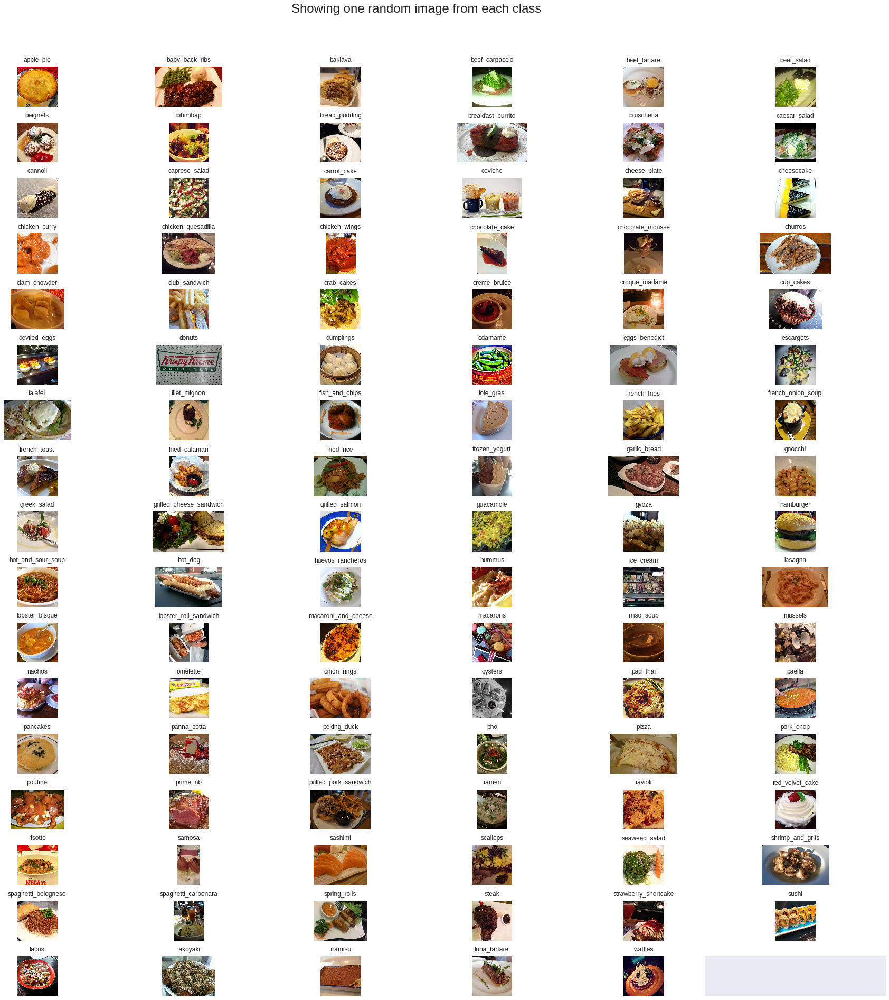

In [0]:
rows = 17
cols = 6
fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
data_dir = "food-101/images"
foods_sorted = sorted(os.listdir(data_dir))
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id] 
      food_id += 1
    except:
      break
    if food_selected == '.DS_Store':
        continue
        
     # returns the list of all files present in each food category

    food_selected_images = os.listdir(os.path.join(data_dir,food_selected))      # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images)                # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()

In [0]:
# Helper method to split dataset on the basis of given info
def split_data(filepath, source, dest):
  classes_img = defaultdict(list)
  with open(filepath, 'r') as txt:
    paths = [read.strip() for read in txt.readlines()]
    for path in paths:
      food_class = path.split('/')
      classes_img[food_class[0]].append(food_class[1] + '.jpg')
      
    for food in classes_img.keys():
      print("\nCopying images into ",food)
      if not os.path.exists(os.path.join(dest,food)):
        os.makedirs(os.path.join(dest,food))
      for i in classes_img[food]:
        copy(os.path.join(source,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

In [0]:
print("Preparing training data...")
split_data('/content/gdrive/My Drive/food-101/meta/train.txt', '/content/gdrive/My Drive/food-101/images', 'train')

Preparing training data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copyin

In [0]:
print("Preparing test data...")
split_data('food-101/meta/test.txt', 'food-101/images', 'test')

Preparing test data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying im

In [0]:
def mini_dataset(food_list, src, dest):
  if os.path.exists(dest):
    rmtree(dest) # removing dataset_mini(if it already exists) folders so that we will have only the classes that we want
  os.makedirs(dest)
  for food_item in food_list :
    print("Copying images into",food_item)
    copytree(os.path.join(src,food_item), os.path.join(dest,food_item))

In [0]:
food_list = ['apple_pie','pizza','omelette', 'sushi']
src_train = 'train'
dest_train = 'train_mini'
src_test = 'test'
dest_test = 'test_mini'

In [0]:
print("Creating mini train data folder with new classes")
mini_dataset(food_list, src_train, dest_train)

Creating mini train data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette
Copying images into sushi


In [0]:
print("Total number of samples in train folder")

!find train_mini -type d -or -type f -printf '.' | wc -c


Total number of samples in train folder
3000


In [0]:
print("Creating mini test data folder with new classes")
mini_dataset(food_list, src_test, dest_test)


Creating mini test data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette
Copying images into sushi


In [0]:
print("Total number of samples in test folder")

!find test_mini -type d -or -type f -printf '.' | wc -c


Total number of samples in test folder
1000


In [0]:
K.clear_session()
n_classes = 4
img_width, img_height = 299, 299
train_data_dir = 'train_mini'
validation_data_dir = 'test_mini'
nb_train_samples = 3000 #75750
nb_validation_samples = 1000 #25250
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


resnet = ResNet50(weights='imagenet', include_top=False)
x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(4,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=resnet.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='best_model_mini_class.hdf5', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_mini_class.log')

history = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=30,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save('model_trained_mini_class.hdf5')



Found 3000 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [0]:
model.load_weights('best_model_mini_class.hdf5')

In [0]:

def plot_accuracy(history,title):
    plt.title(title)
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train_acc', 'val_acc'], loc='best')
    plt.show()
    
def plot_loss(history,title):
    plt.title(title)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'val_loss'], loc='best')
    plt.show()

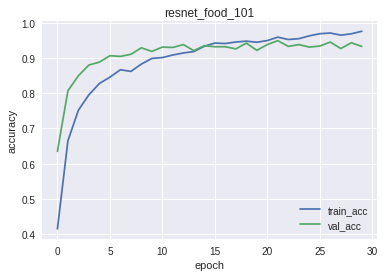

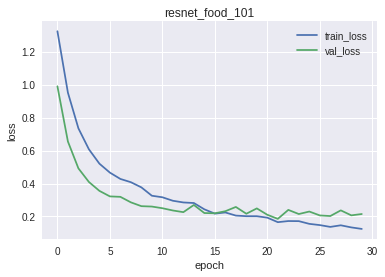

In [0]:
plot_accuracy(history,'resnet_food_101')
plot_loss(history,'resnet_food_101')

In [0]:
!wget -O apple_pie.jpg https://images-gmi-pmc.edge-generalmills.com/173da066-c6b4-45dd-9b28-0d459cf6f169.jpg
!wget -O sushi.jpg https://img.grouponcdn.com/deal/mJyn1PCrztjcL9q7ao99/Xn-2048x1229/v1/c700x420.jpg
!wget -O pizza.jpg https://food-images.files.bbci.co.uk/food/recipes/alpine_pizza_32132_16x9.jpg
!wget -O omelette.jpg https://cdn1.woolworths.media/content/wowrecipeimages/large/0911-jamieomelette-lf.jpg

--2019-03-22 08:03:32--  https://images-gmi-pmc.edge-generalmills.com/173da066-c6b4-45dd-9b28-0d459cf6f169.jpg
Resolving images-gmi-pmc.edge-generalmills.com (images-gmi-pmc.edge-generalmills.com)... 192.229.144.76
Connecting to images-gmi-pmc.edge-generalmills.com (images-gmi-pmc.edge-generalmills.com)|192.229.144.76|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 72693 (71K) [image/jpg]
Saving to: ‘apple_pie.jpg’

apple_pie.jpg       100%[===================>]  70.99K  --.-KB/s    in 0.01s   

2019-03-22 08:03:33 (5.63 MB/s) - ‘apple_pie.jpg’ saved [72693/72693]

--2019-03-22 08:03:35--  https://img.grouponcdn.com/deal/mJyn1PCrztjcL9q7ao99/Xn-2048x1229/v1/c700x420.jpg
Resolving img.grouponcdn.com (img.grouponcdn.com)... 23.219.34.211
Connecting to img.grouponcdn.com (img.grouponcdn.com)|23.219.34.211|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 123573 (121K) [image/jpeg]
Saving to: ‘sushi.jpg’

sushi.jpg           100%[==========

**Going deeper into convolutions**

Feeding an input image to the network, finding out activations and ploting them with matplot

In [0]:
def predict_food(model, images, show = True):
  for img in images:
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255.                                      

    prediction = model.predict(img)
    index = np.argmax(prediction)
    food_list.sort()
    pred_value = food_list[index]
    if show:
        plt.imshow(img[0])                           
        plt.axis('off')
        plt.title(pred_value)
        plt.show()

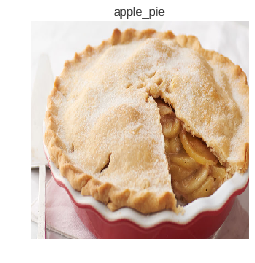

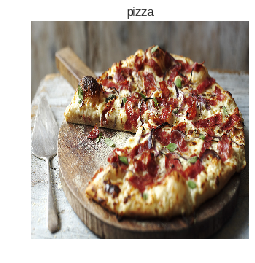

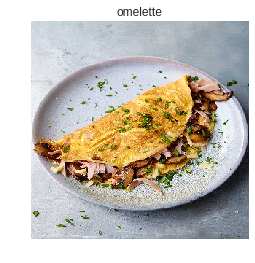

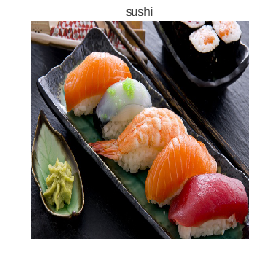

In [0]:
test_images = []
test_images.append('apple_pie.jpg')
test_images.append('pizza.jpg')
test_images.append('omelette.jpg')
test_images.append('sushi.jpg')

predict_food(model, test_images, True)

In [0]:
K.clear_session()
print("Loading the model..")
model = load_model('best_model_mini_class.hdf5',compile = False)
print("Done!")

Loading the model..
Instructions for updating:
`normal` is a deprecated alias for `truncated_normal`
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Done!


In [0]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalizationV1) (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

**Deprocessing image**

Normalized the input tensor, basic stuff clipped the values to lie between 0 and 1. Finally converted to image format.

In [0]:
def deprocess_image(x):
    # normalize tensor
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [0]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

In [0]:
def get_activations(img, model_activations):
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255. 
    plt.imshow(img[0])
    plt.show()
    return model_activations.predict(img)

In [0]:
def show_activations(activations, layer_names):
    
    images_per_row = 16

    # Now let's display our feature maps
    for layer_name, layer_activation in zip(layer_names, activations):
        # This is the number of features in the feature map
        n_features = layer_activation.shape[-1]

        # The feature map has shape (1, size, size, n_features)
        size = layer_activation.shape[1]

        # We will tile the activation channels in this matrix
        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        # We'll tile each filter into this big horizontal grid
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                 :, :,
                                                 col * images_per_row + row]
                # Post-process the feature to make it visually palatable
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = channel_image

        # Display the grid
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

    plt.show()

**Visualising the output of each layer**

In [0]:
layers = [layer.output for layer in model.layers[1:11]]

# We now initialize a model which takes an input and outputs the above chosen layers
activations_output = models.Model(inputs=model.input, outputs=layers)

In [0]:
layer_names = []
for layer in model.layers[1:11]:
    layer_names.append(layer.name)
print(layer_names)

['conv1_pad', 'conv1', 'bn_conv1', 'activation_1', 'pool1_pad', 'max_pooling2d_1', 'res2a_branch2a', 'bn2a_branch2a', 'activation_2', 'res2a_branch2b']


**Visualising activations so as to get a clear picture of a how any layer process an image**

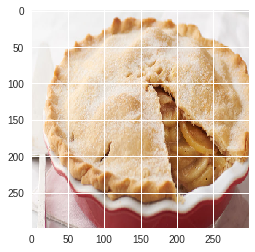

In [0]:
dish = 'apple_pie.jpg'
activations = get_activations(dish,activations_output)

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:857: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  self.axes.set_ylim((ymin, ymax), auto=None)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/matplotlib/axis.py:1081: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "
/usr/local/lib/python3.6/dist-packages/matplotlib/axis.py:1091: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


RuntimeError: ignored

<Figure size 1152x0 with 1 Axes>

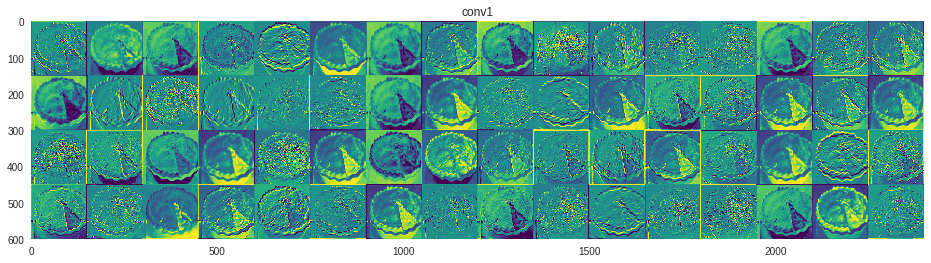

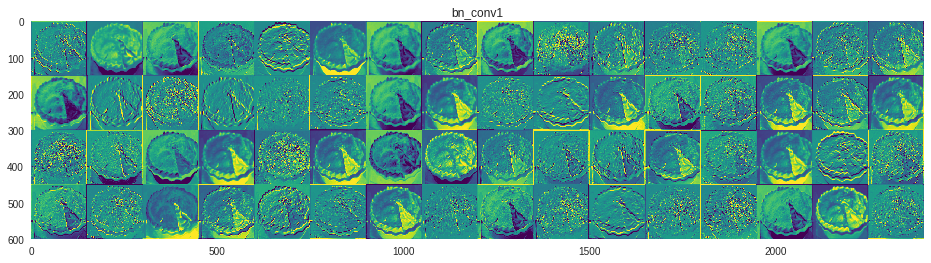

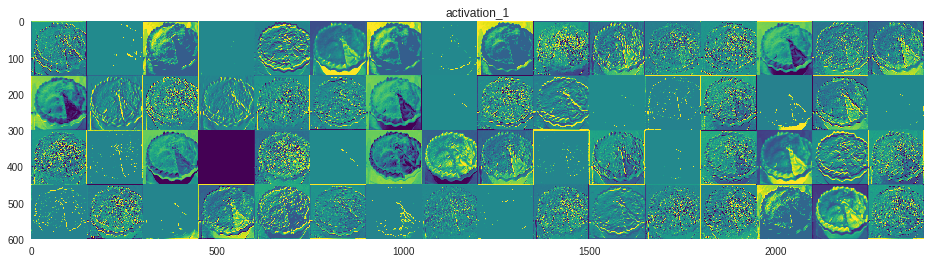

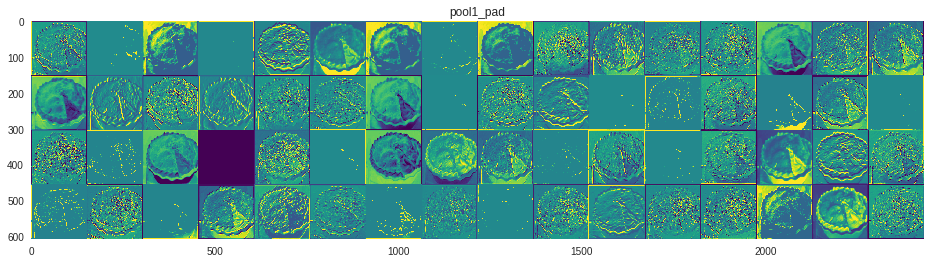

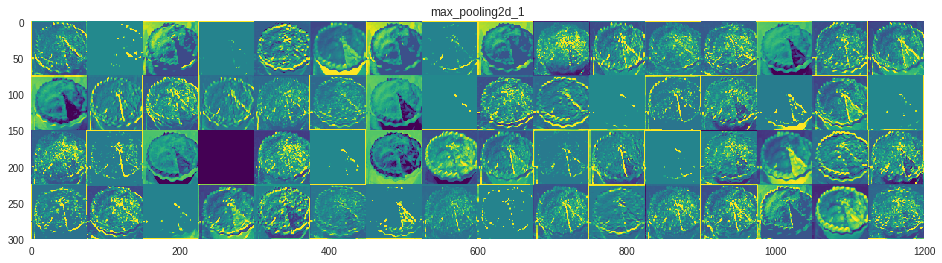

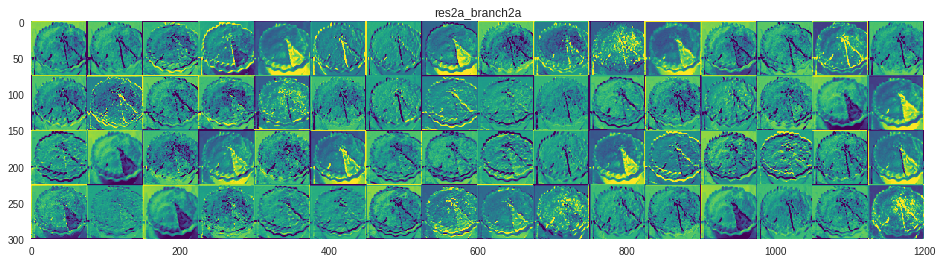

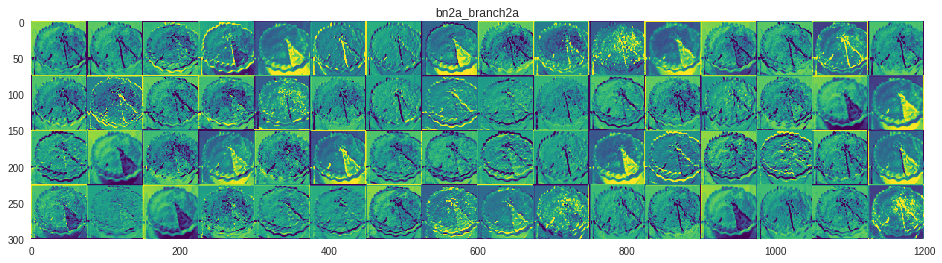

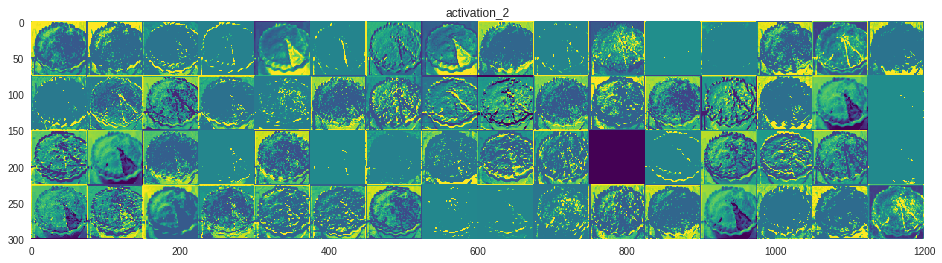

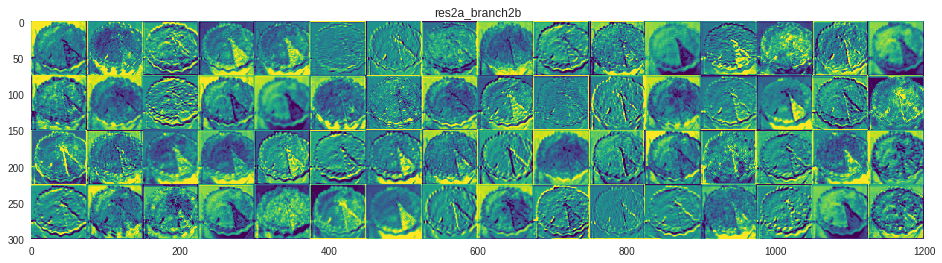

In [0]:
show_activations(activations, layer_names)

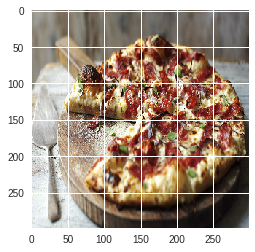

In [0]:
dish = 'pizza.jpg'
activations = get_activations(dish,activations_output)

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:857: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  self.axes.set_ylim((ymin, ymax), auto=None)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/matplotlib/axis.py:1081: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "
/usr/local/lib/python3.6/dist-packages/matplotlib/axis.py:1091: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


RuntimeError: ignored

<Figure size 1152x0 with 1 Axes>

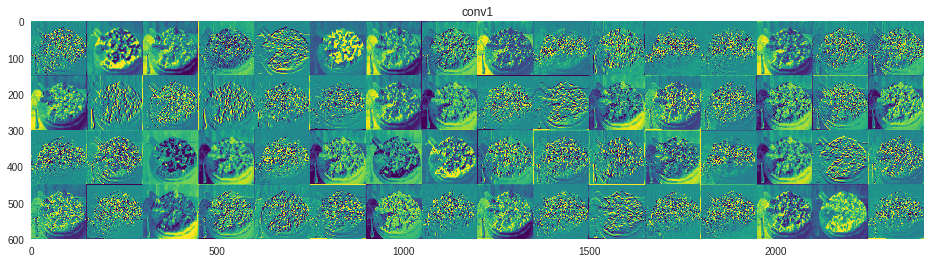

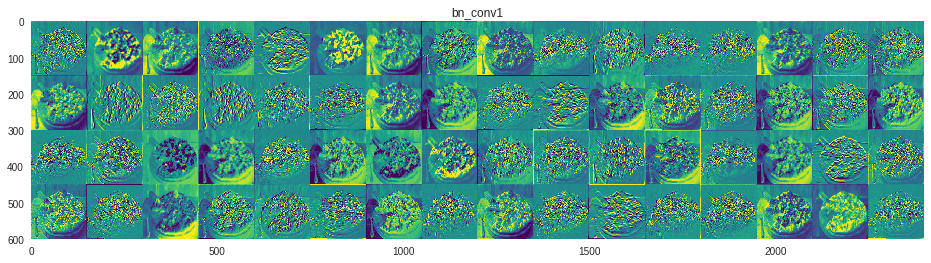

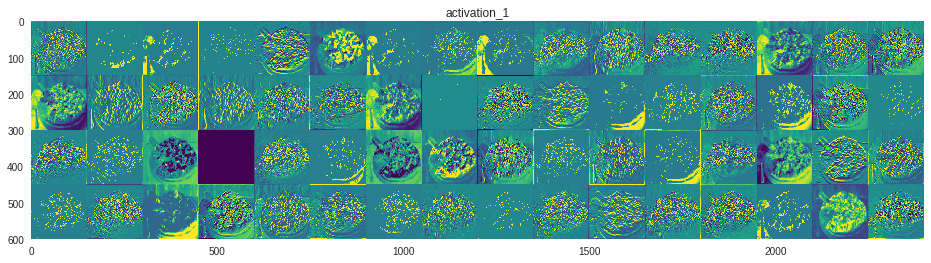

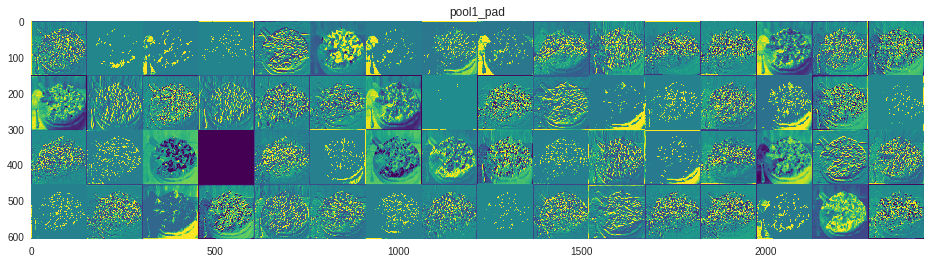

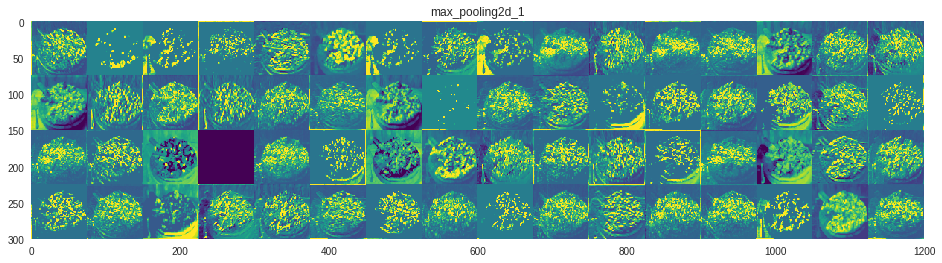

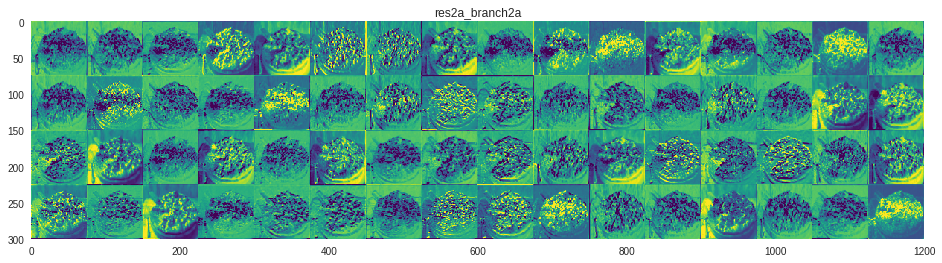

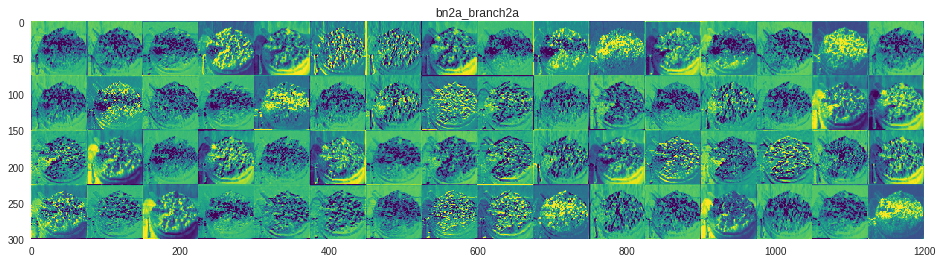

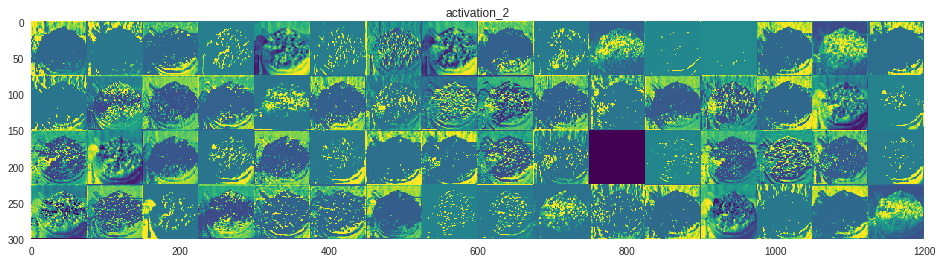

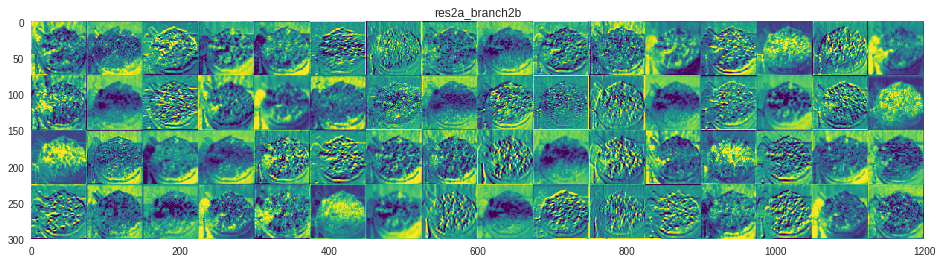

In [0]:
show_activations(activations, layer_names)

*Trying to find a workaround that runtime error*

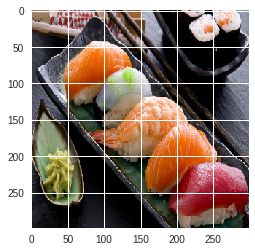

In [0]:
dish = 'sushi.jpg'
activations = get_activations(dish,activations_output)

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:857: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  self.axes.set_ylim((ymin, ymax), auto=None)
/usr/local/lib/python3.6/dist-packages/matplotlib/axis.py:1081: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "
/usr/local/lib/python3.6/dist-packages/matplotlib/axis.py:1091: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


RuntimeError: ignored

<Figure size 1152x0 with 1 Axes>

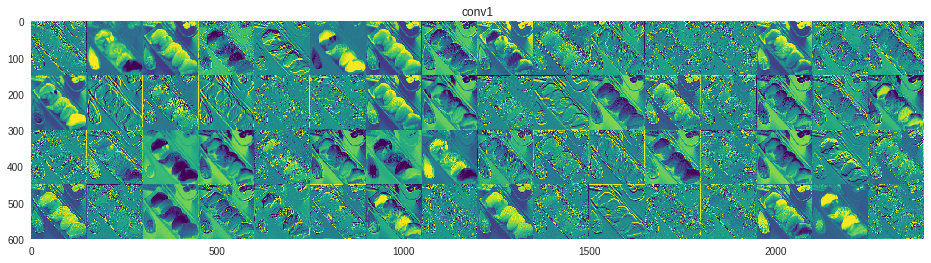

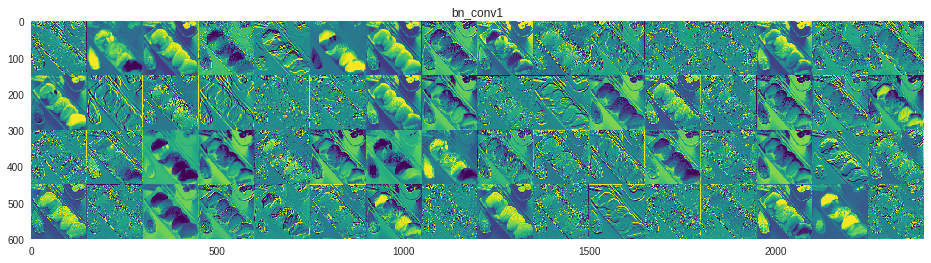

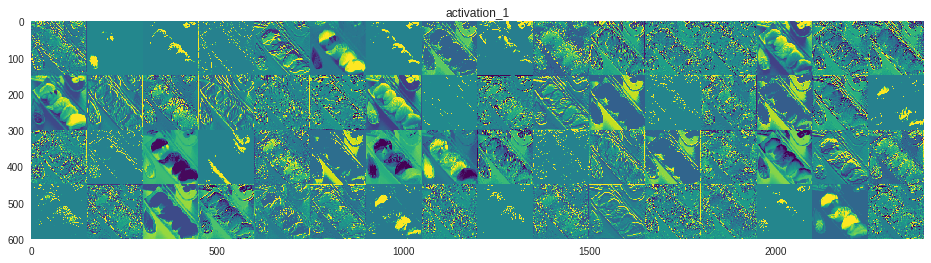

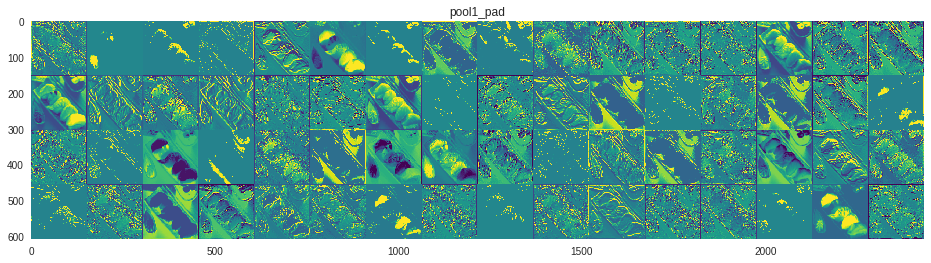

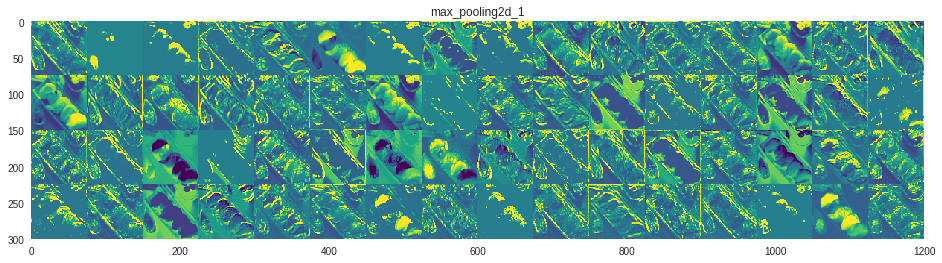

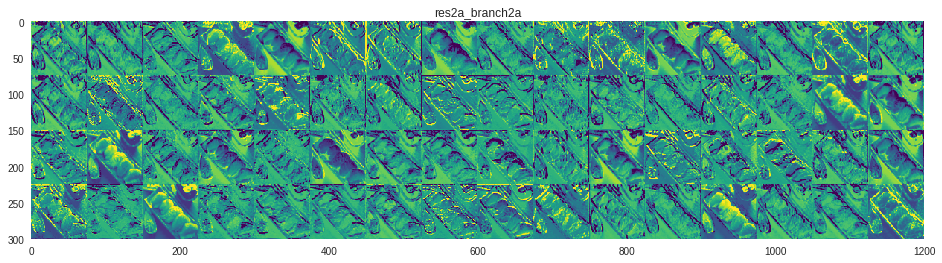

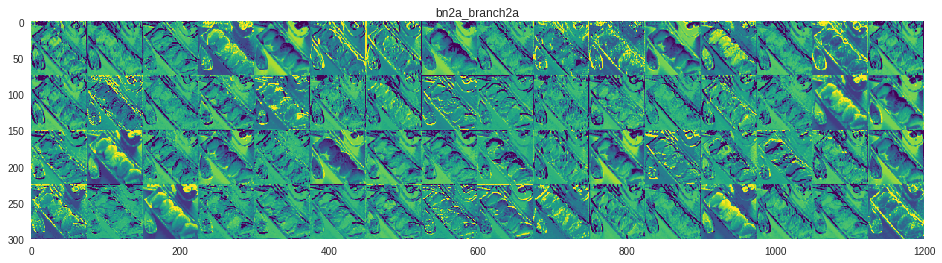

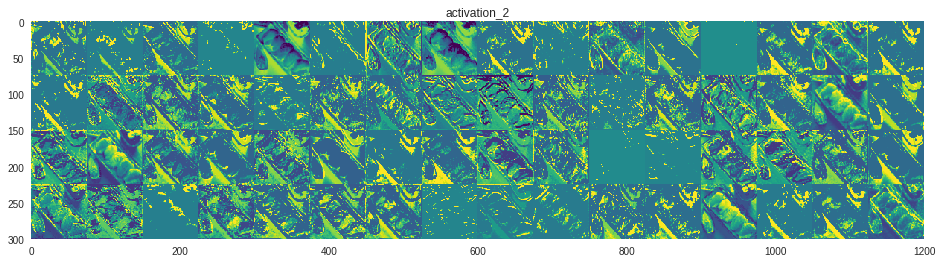

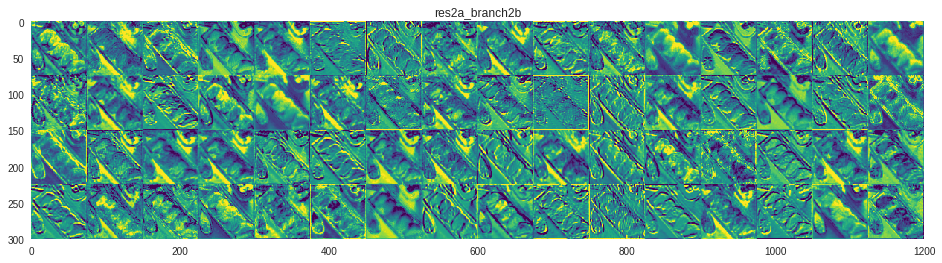

In [0]:
show_activations(activations, layer_names)

In [4]:
K.clear_session()
n_classes = 101
img_width, img_height = 299, 299
train_data_dir = 'train'
validation_data_dir = 'test'
nb_train_samples = 75750
nb_validation_samples = 25250
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

resnet = ResNet50(weights='imagenet', include_top=False)
x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(512,activation='relu')(x)
x = Dropout(0.4)(x)

predictions = Dense(101,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=resnet.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='best_model_3class.hdf5', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_3class.log')
history = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=20,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save('model_trained_3class.hdf5')

Found 75750 images belonging to 101 classes.
Found 25250 images belonging to 101 classes.


**Loading the model trained on 101 classes**

Note: couldnt't train it more than 10 epochs and make it to converge due to my system constraints.
Requires 50 hours of training.

In [5]:
K.clear_session()
print("Loading the model..")
model = load_model('best_model_3class.hdf5',compile = False)
print("Done!")

Loading the model..
Instructions for updating:
`normal` is a deprecated alias for `truncated_normal`
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Done!


In [11]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalizationV1) (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [0]:
model.compile('sgd','mse')
loss, acc = model.evaluate_generator(generator=validation_generator)